In [51]:
import os
list = os.listdir('../input/cedaredge-colorado/4thAve/')
for i in range(len(list)):
  print(list[i])

DJI_0027.JPG
DJI_0042.JPG
DJI_0044.JPG
DJI_0016.JPG
DJI_0031.JPG
DJI_0049.JPG
DJI_0045.JPG
DJI_0047.JPG
DJI_0028.JPG
DJI_0025.JPG
DJI_0010.JPG
DJI_0001.JPG
DJI_0004.JPG
DJI_0043.JPG
DJI_0017.JPG
DJI_0041.JPG
DJI_0033.JPG
DJI_0036.JPG
DJI_0002.JPG
DJI_0046.JPG
DJI_0007.JPG
DJI_0018.JPG
DJI_0032.JPG
DJI_0038.JPG
DJI_0026.JPG
DJI_0019.JPG
DJI_0030.JPG
DJI_0011.JPG
DJI_0022.JPG
DJI_0023.JPG
DJI_0034.JPG
DJI_0015.JPG
DJI_0020.JPG
DJI_0048.JPG
DJI_0009.JPG
DJI_0012.JPG
DJI_0024.JPG
DJI_0006.JPG
DJI_0008.JPG
DJI_0014.JPG
DJI_0005.JPG
DJI_0037.JPG
DJI_0035.JPG
DJI_0021.JPG
DJI_0029.JPG
DJI_0039.JPG
DJI_0013.JPG
DJI_0040.JPG


In [52]:
import matplotlib.image as mpimg
images = []
for i in range(len(list)):
  image = mpimg.imread('../input/cedaredge-colorado/4thAve/'+list[i])
  images.append(image)

In [53]:
!pip install imutils

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [54]:
import imutils
import numpy as np
import cv2

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

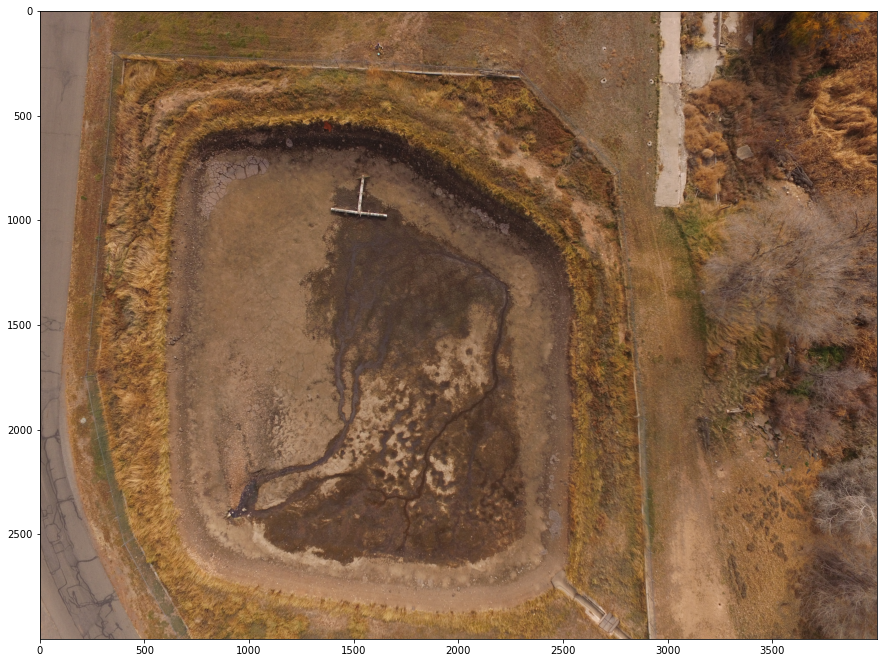

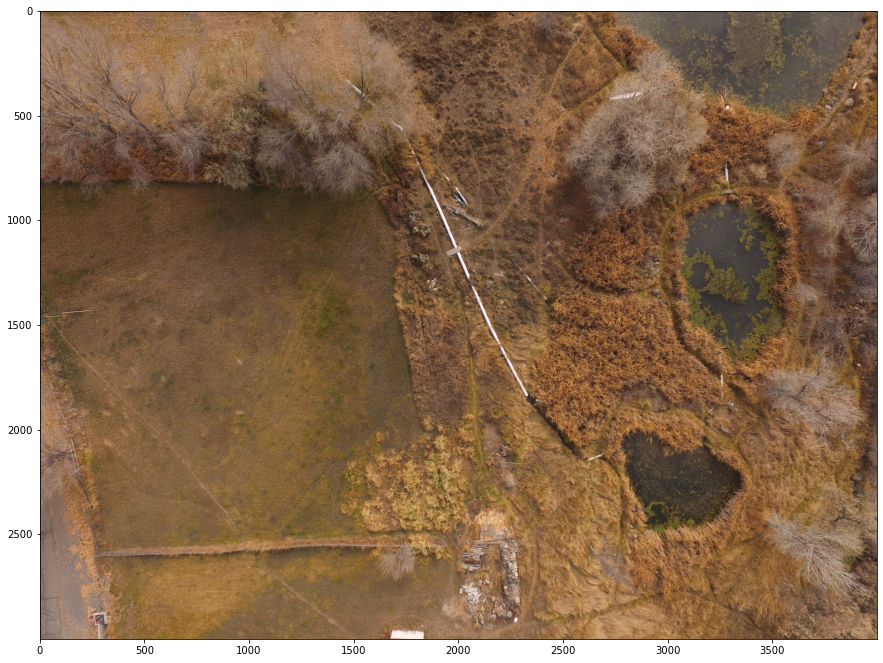

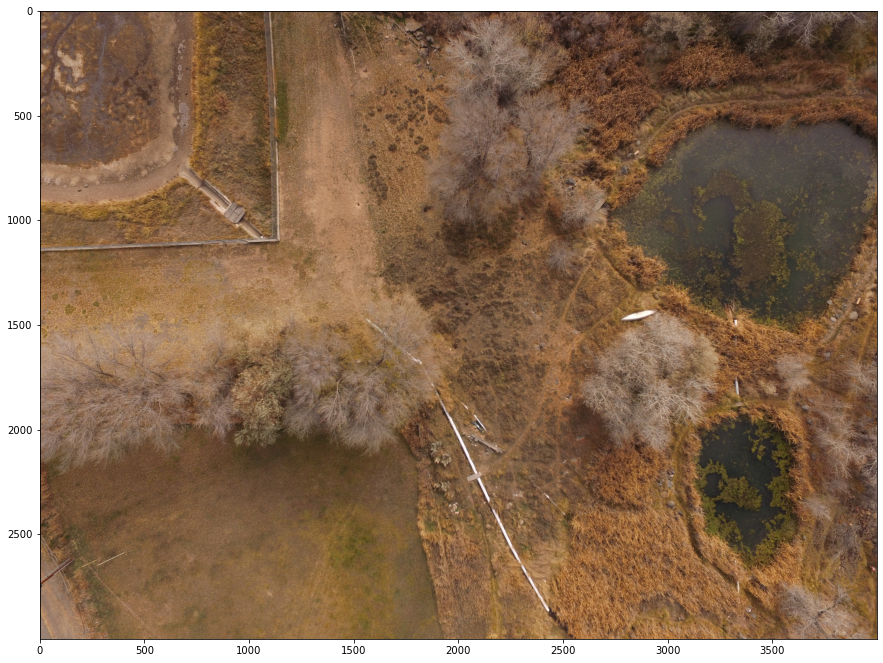

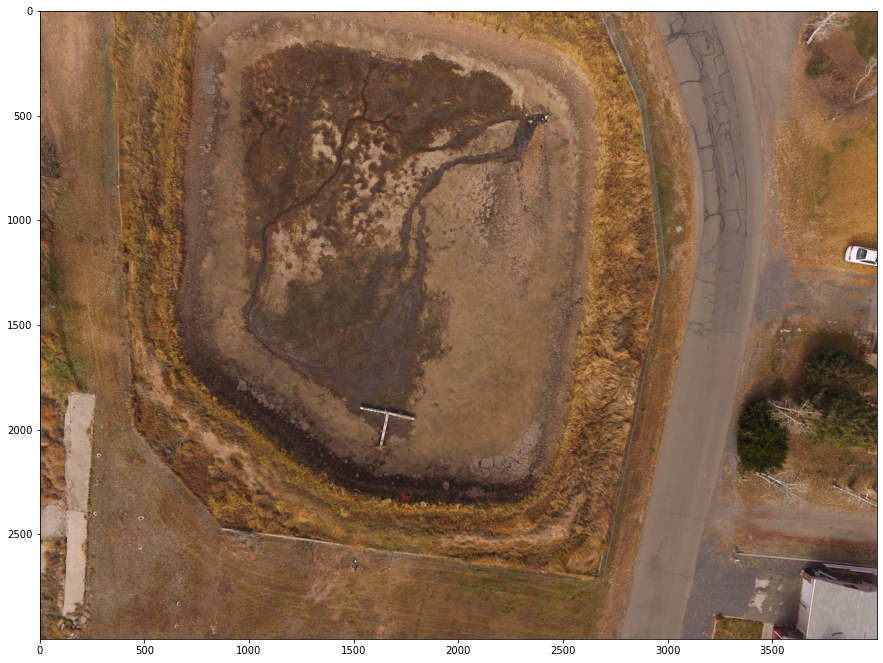

In [55]:
#to display the first four images

for i in range(4):
    plt.figure(figsize=(15,15))
    plt.imshow( images[i])

In [56]:
# stitching:
# initialize OpenCV's image sticher object and then perform the image
print("stitching images...")
stitcher = cv2.Stitcher_create(0)
(status, stitched) = stitcher.stitch(images)

stitching images...


In [57]:
if status == 0:
    print("stitching successful")

stitching successful


In [58]:
image

array([[[106,  68,  47],
        [111,  73,  52],
        [116,  78,  55],
        ...,
        [158, 136, 122],
        [160, 138, 124],
        [160, 138, 124]],

       [[109,  71,  50],
        [108,  70,  49],
        [115,  77,  56],
        ...,
        [157, 135, 121],
        [158, 136, 122],
        [158, 136, 122]],

       [[115,  77,  56],
        [116,  78,  57],
        [123,  85,  64],
        ...,
        [157, 136, 119],
        [157, 135, 121],
        [159, 137, 123]],

       ...,

       [[127, 113, 112],
        [128, 114, 113],
        [128, 114, 113],
        ...,
        [113,  92,  39],
        [115,  94,  41],
        [112,  91,  36]],

       [[125, 111, 110],
        [127, 113, 112],
        [126, 112, 111],
        ...,
        [114,  91,  39],
        [123, 100,  46],
        [119,  96,  42]],

       [[126, 112, 111],
        [127, 113, 112],
        [126, 112, 111],
        ...,
        [115,  92,  38],
        [130, 107,  53],
        [126, 103,  49]]

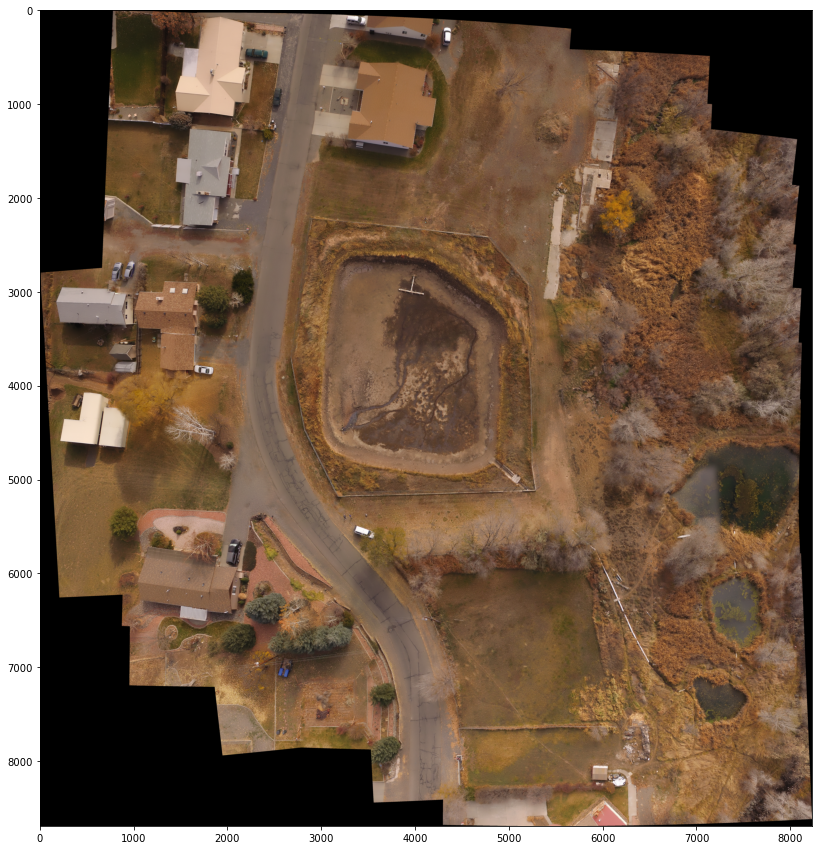

In [59]:
# display  the current result:
plt.figure(figsize=(15,15))
plt.imshow(stitched)

In [60]:
# create a 10 pixel border surrounding the stitched image
print("cropping...")
stitched = cv2.copyMakeBorder(stitched, 10, 10, 10, 10,cv2.BORDER_CONSTANT, (0, 0, 0))

cropping...


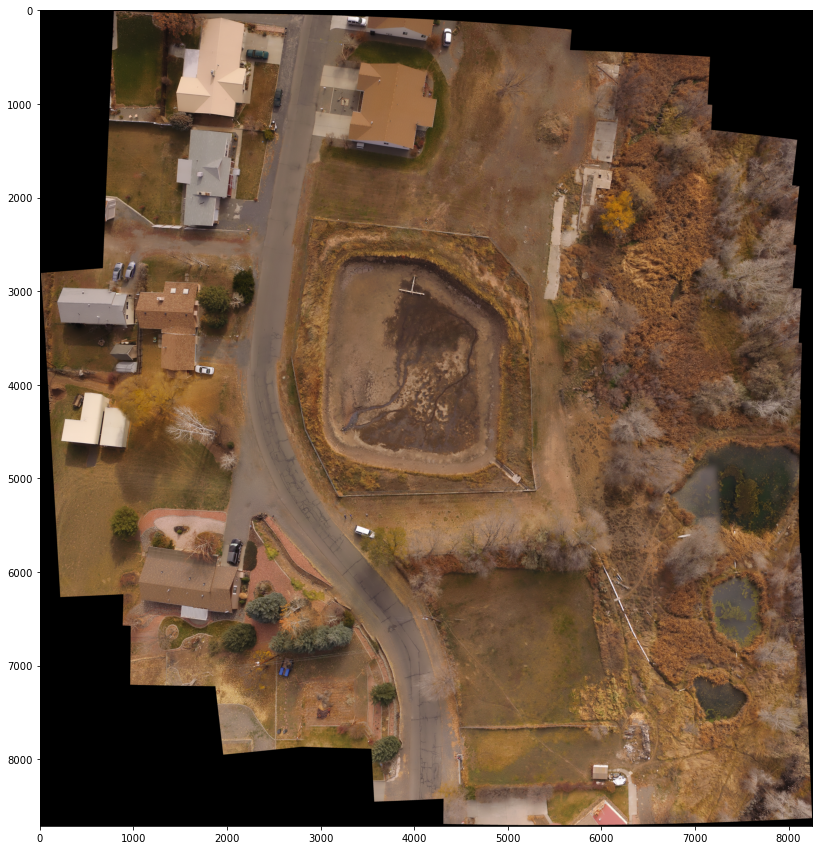

In [61]:
# display  the current result:
plt.figure(figsize=(15,15))
plt.imshow( stitched)

In [62]:
# convert the stitched image to grayscale and threshold it such that all pixels greater than zero are set to 255
# (foreground) while all others remain 0 (background)
gray = cv2.cvtColor(stitched, cv2.COLOR_BGR2GRAY)
thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]

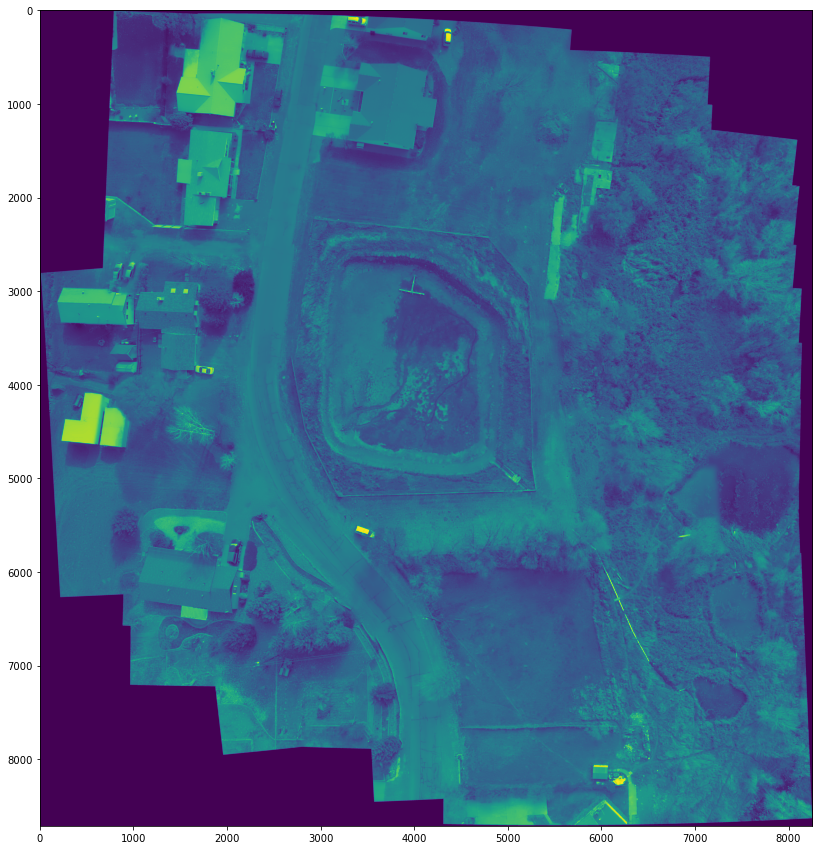

In [63]:
plt.figure(figsize=(15,15))
plt.imshow( gray)

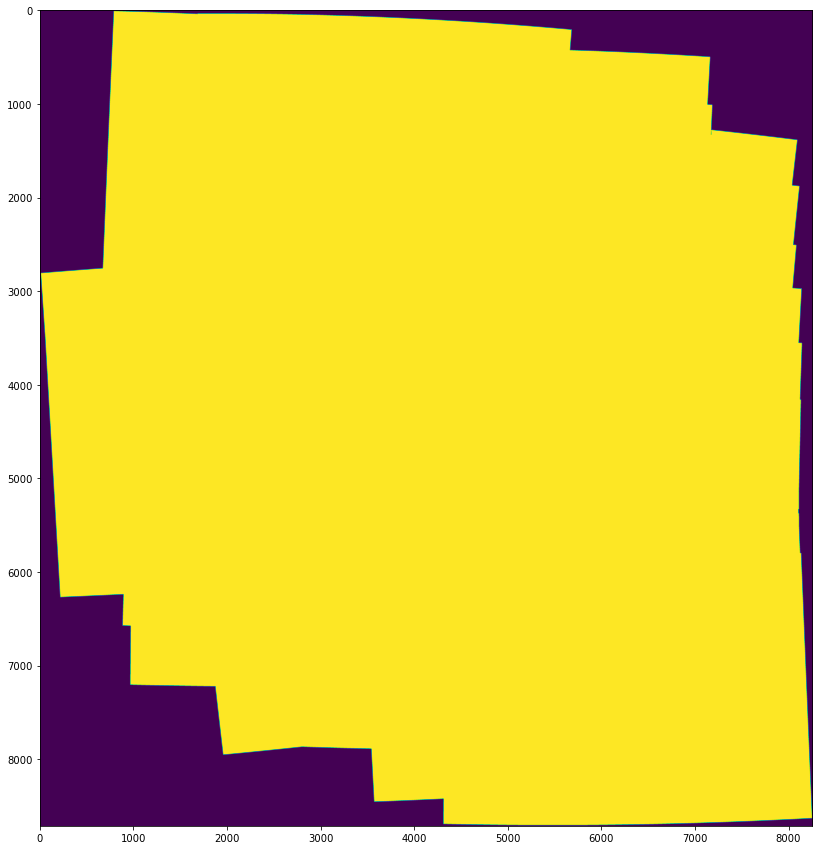

In [64]:
plt.figure(figsize=(15,15))
plt.imshow(thresh)

In [65]:
# find all external contours in the threshold image
# then find the *largest* contour which will be the contour/outline of the stitched image
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)

In [66]:
# allocate memory for the mask which will contain the rectangular bounding box of the stitched image region
mask = np.zeros(thresh.shape, dtype="uint8")
(x, y, w, h) = cv2.boundingRect(c)
cv2.rectangle(mask, (x, y), (x + w, y + h), 255, -1)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

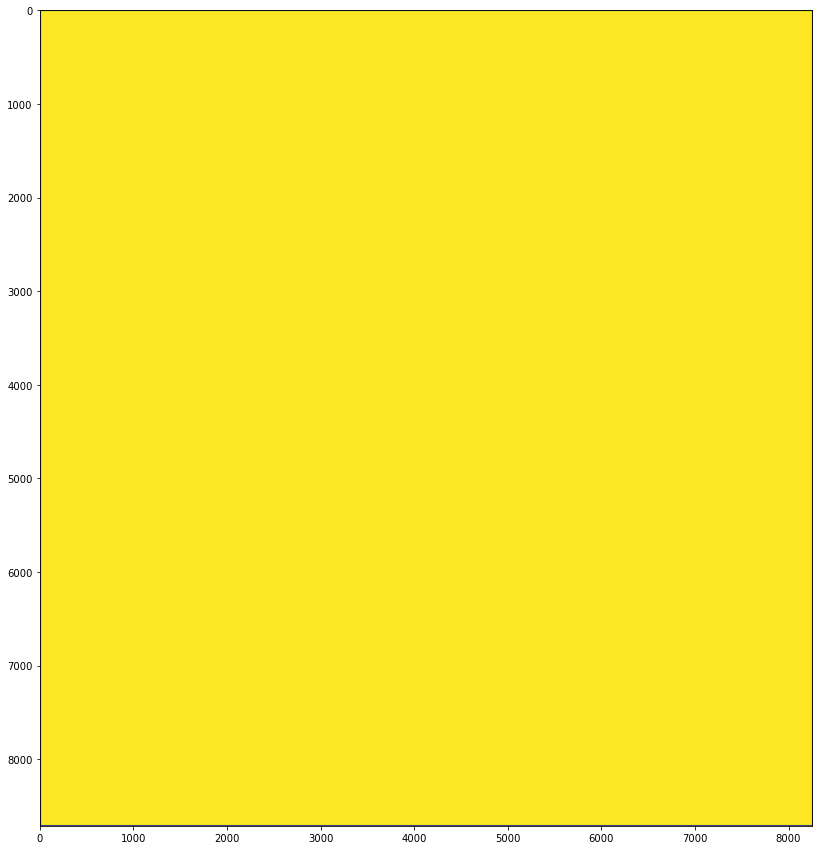

In [67]:
plt.figure(figsize=(15,15))
plt.imshow( mask)

In [68]:
# create two copies of the mask: one to serve as our actual minimum rectangular region
# and another to serve as a counter for how many pixels need to be removed to form the minimum rectangular region
minRect = mask.copy()
sub = mask.copy()

In [69]:
# keep looping until there are no non-zero pixels left in the subtracted image
while cv2.countNonZero(sub) > 0:
# erode the minimum rectangular mask and then subtract the thresholded image from the minimum rectangular mask
# so we can count if there are any non-zero pixels left
    minRect = cv2.erode(minRect, None)
    sub = cv2.subtract(minRect, thresh)

In [70]:
# find contours in the minimum rectangular mask and then extract the bounding box (x, y)-coordinates
cnts = cv2.findContours(minRect.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
c = max(cnts, key=cv2.contourArea)
(x, y, w, h) = cv2.boundingRect(c)

In [71]:
# use the bounding box coordinates to extract the our final
# stitched image
stitched = stitched[y:y + h, x:x + w]


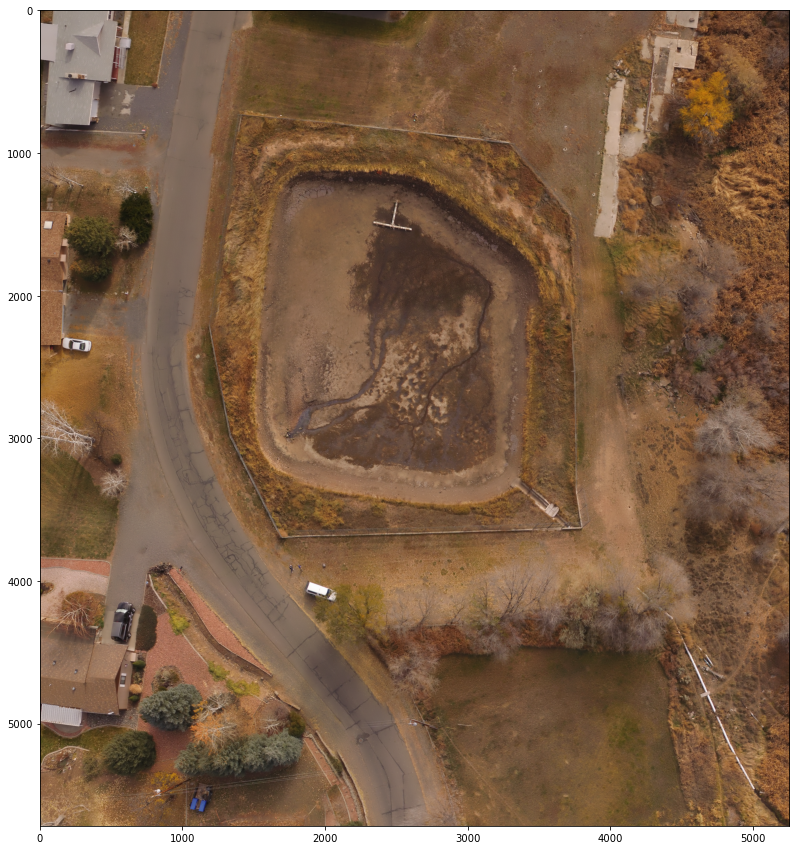

In [72]:
# display the output stitched image to our screen
#final Image
plt.figure(figsize=(15,15)) 
plt.imshow(stitched)